Importing Libraries

In [1]:
# pip install contractions

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

import nltk
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

from nltk.corpus import stopwords

import contractions
import string
import re
from wordcloud import WordCloud

import warnings
warnings.filterwarnings("ignore")

In [3]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\bhanu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bhanu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
# reading the data from the saved CSV files
# tweet consists the original data without any changes

tweet = pd.read_csv('tweet.csv')
tweet_1 = pd.read_csv('First_tweets.csv')
tweet_2 = pd.read_csv('Last_tweets.csv')
tweet_3 = pd.read_csv('Unique_tweets.csv')

As we have classified the data set into 3 different types, which makes totally 4, starting EDA with RAW DATA

In [6]:
tweet.head()

,tweets,class
0,Be aware dirty step to get money #staylight ...,figurative
1,#sarcasm for #people who don't understand #diy...,figurative
2,@IminworkJeremy @medsingle #DailyMail readers ...,figurative
3,@wilw Why do I get the feeling you like games?...,figurative
4,-@TeacherArthurG @rweingarten You probably jus...,figurative


In [7]:
# number of words in the dataframe
t0_df =tweet['tweets'].str.len().sum()
t0_df

8340662

# EDA ON RAW DATA

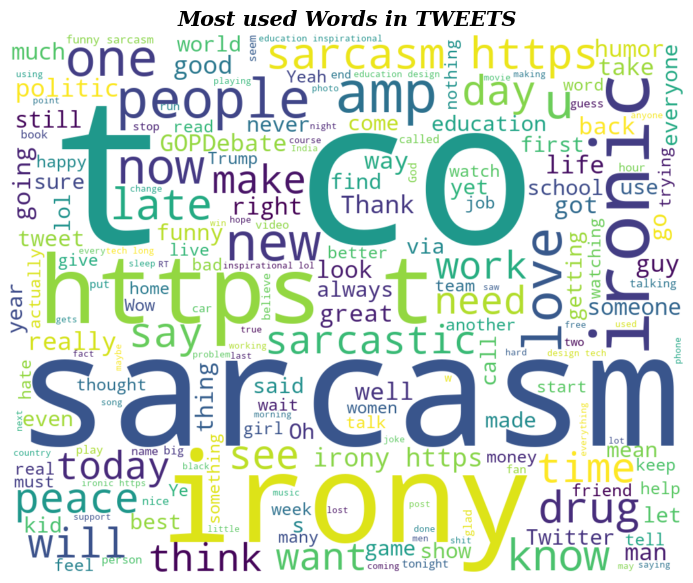

In [8]:
raw_tweets=' '.join(tweet['tweets'])
# Create word cloud
wordcloud = WordCloud(width=1000, height=800, random_state=100,background_color='white').generate(str(raw_tweets))

# Plot the word cloud
plt.figure(figsize=(10, 7))
plt.title('Most used Words in TWEETS', family= 'serif', fontsize= 15, weight= 'bold', style ='italic')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

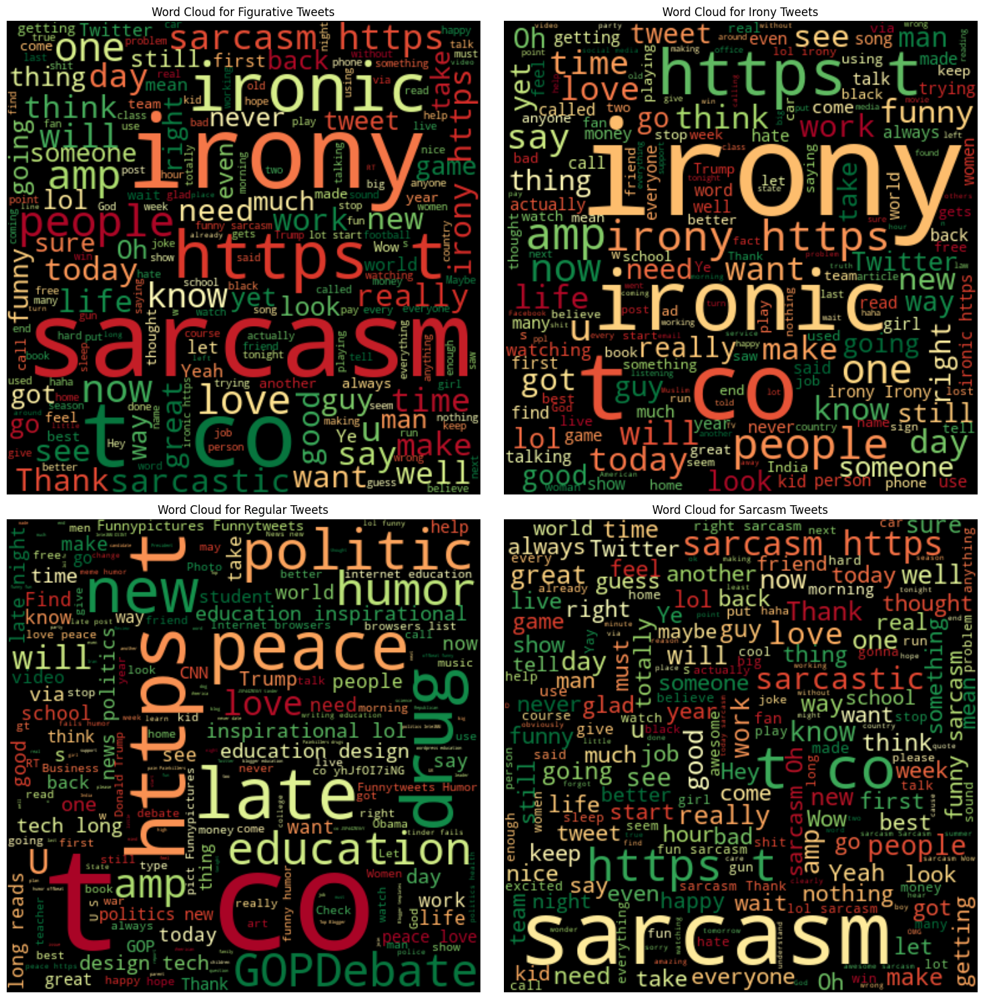

In [9]:
# Generate word clouds for each type
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

for idx, tweet_class in enumerate(tweet['class'].unique()):
    row = idx // 2
    col = idx % 2

    text = ' '.join(tweet[tweet['class'] == tweet_class]['tweets'])

    wordcloud = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text)

    axes[row, col].imshow(wordcloud, interpolation='bilinear')
    axes[row, col].set_title(f'Word Cloud for {tweet_class.capitalize()} Tweets')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [10]:
raw_twt = tweet['tweets'].apply(word_tokenize)
# Join the words within the lists and count word frequencies
total_words_raw = [word.lower() for inner_list in raw_twt for word in inner_list]
wordfreqdist_raw = nltk.FreqDist(total_words_raw)
mostcommon_raw = wordfreqdist_raw.most_common(100)
mostcommon_raw

[('#', 179368),
 (':', 43793),
 ('.', 42296),
 ('@', 41816),
 ('the', 34399),
 ('sarcasm', 29985),
 ('http', 25601),
 ('to', 24968),
 ('irony', 24147),
 ('a', 22180),
 (',', 21081),
 ('i', 20839),
 ('!', 18736),
 ('of', 15109),
 ('is', 14908),
 ('in', 13507),
 ('and', 13061),
 ('?', 12756),
 ('you', 12053),
 ('for', 11162),
 ('it', 10824),
 ("'s", 10531),
 ('https', 10143),
 ('that', 10042),
 ('on', 9929),
 ("n't", 8367),
 ('ironic', 8235),
 ('...', 7996),
 ('my', 7581),
 ('this', 6443),
 ("''", 5912),
 ('``', 5834),
 ('are', 5696),
 ('so', 5532),
 ('be', 5367),
 ('with', 5327),
 ('at', 5202),
 (';', 5047),
 ('do', 4874),
 ('have', 4788),
 ('not', 4639),
 ('just', 4592),
 ('but', 4340),
 ('me', 4300),
 ('&', 4235),
 ('was', 4218),
 ('they', 4162),
 ('we', 4069),
 ('about', 3992),
 ('when', 3961),
 ('all', 3922),
 ('what', 3627),
 ('-', 3604),
 ('your', 3604),
 ('amp', 3496),
 ('news', 3449),
 ('how', 3428),
 ('love', 3343),
 ('like', 3342),
 ('people', 3294),
 ('he', 3294),
 ('by', 326

From the above word cloud and word count, it can be observed that web links(http) and puncuations need to be removed

In [11]:
#removing http links
tweet_no_link = tweet["tweets"].apply(lambda x: re.sub(r'http\S+', '', x))

#applying Contractions
expanded_text = tweet_no_link.apply(lambda text: contractions.fix(text))

# Splitting the text into individual words or tokens.
# tokenization
twt = expanded_text.apply(word_tokenize)

# Converting all the words to lower case
# Normalizing
low_twt = twt.apply(lambda x: [word.lower() for word in x])
low_twt

0        [be, aware, dirty, step, to, get, money, #, st...
1        [#, sarcasm, for, #, people, who, do, not, und...
2        [@, iminworkjeremy, @, medsingle, #, dailymail...
3        [@, wilw, why, do, i, get, the, feeling, you, ...
4        [-, @, teacherarthurg, @, rweingarten, you, pr...
                               ...                        
81403    [photo, :, image, via, we, heart, it, #, child...
81404    [i, never, knew, .., i, better, put, this, out...
81405    [hey, just, wanted, to, say, thanks, @, pubert...
81406    [i, am, sure, coverage, like, the, fox, news, ...
81407    [@, skeyno16, at, u13, ?, !, i, will, not, bel...
Name: tweets, Length: 81408, dtype: object

In [12]:
result = string.punctuation
print(result)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [13]:
#Removing Punctuations

no_punc = low_twt.apply(lambda x: [word for word in x if word not in result])
no_punc

0        [be, aware, dirty, step, to, get, money, stayl...
1        [sarcasm, for, people, who, do, not, understan...
2        [iminworkjeremy, medsingle, dailymail, readers...
3        [wilw, why, do, i, get, the, feeling, you, lik...
4        [teacherarthurg, rweingarten, you, probably, j...
                               ...                        
81403    [photo, image, via, we, heart, it, childhood, ...
81404    [i, never, knew, .., i, better, put, this, out...
81405    [hey, just, wanted, to, say, thanks, puberty, ...
81406    [i, am, sure, coverage, like, the, fox, news, ...
81407    [skeyno16, at, u13, i, will, not, believe, it,...
Name: tweets, Length: 81408, dtype: object

In [14]:
# Function to remove any other symbols from a word
def remove_symbols(word):
    return re.sub(r'[^\w\s]', '', word)
for i in range(2):

# Remove symbols and single-letter words, looping the code to run twice for clear data
    punch = no_punc.apply(lambda x: [remove_symbols(word) for word in x if len(word) > 1])
punch

0        [be, aware, dirty, step, to, get, money, stayl...
1        [sarcasm, for, people, who, do, not, understan...
2        [iminworkjeremy, medsingle, dailymail, readers...
3        [wilw, why, do, get, the, feeling, you, like, ...
4        [teacherarthurg, rweingarten, you, probably, j...
                               ...                        
81403    [photo, image, via, we, heart, it, childhood, ...
81404    [never, knew, , better, put, this, out, to, th...
81405    [hey, just, wanted, to, say, thanks, puberty, ...
81406    [am, sure, coverage, like, the, fox, news, spe...
81407    [skeyno16, at, u13, will, not, believe, it, un...
Name: tweets, Length: 81408, dtype: object

In [15]:
# Join the tokenized, punctuation-removed clean data
clean = punch. apply(' '.join)

# passing lambda function to remove additional space if exists between words
cleaned = clean.apply(lambda x: re.sub(' +', ' ', x))
cleaned

0        be aware dirty step to get money staylight sta...
1        sarcasm for people who do not understand diy a...
2        iminworkjeremy medsingle dailymail readers bei...
3        wilw why do get the feeling you like games sar...
4        teacherarthurg rweingarten you probably just m...
                               ...                        
81403    photo image via we heart it childhood cool fun...
81404    never knew better put this out to the universe...
81405    hey just wanted to say thanks puberty for lett...
81406    am sure coverage like the fox news special the...
81407    skeyno16 at u13 will not believe it until see ...
Name: tweets, Length: 81408, dtype: object

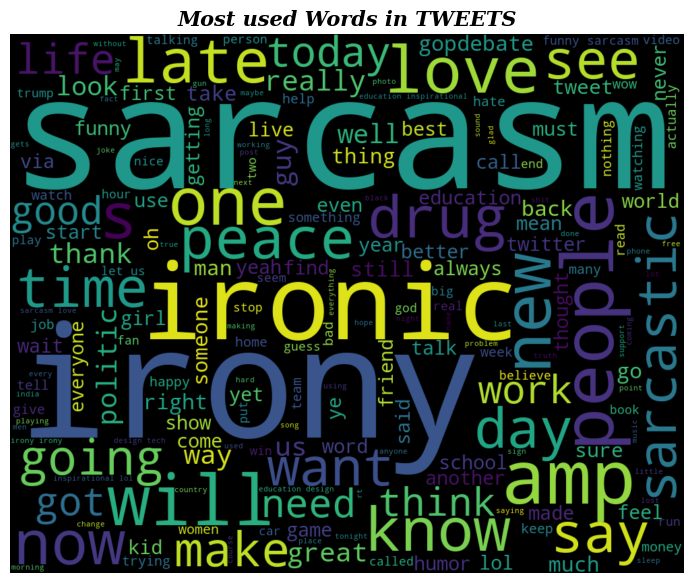

In [16]:
clean_tweets=' '.join(cleaned)
# Create word cloud
wordcloud = WordCloud(width=1000, height=800, random_state=100,background_color='black').generate(str(clean_tweets))

# Plot the word cloud
plt.figure(figsize=(10, 7))
plt.title('Most used Words in TWEETS', family= 'serif', fontsize= 15, weight= 'bold', style ='italic')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [17]:
cleaned_data = pd.DataFrame({'class':tweet['class'], "tweets" : cleaned})
cleaned_data.reset_index(drop=True, inplace= True)
cleaned_data

,class,tweets
0,figurative,be aware dirty step to get money staylight sta...
1,figurative,sarcasm for people who do not understand diy a...
2,figurative,iminworkjeremy medsingle dailymail readers bei...
3,figurative,wilw why do get the feeling you like games sar...
4,figurative,teacherarthurg rweingarten you probably just m...
...,...,...
81403,sarcasm,photo image via we heart it childhood cool fun...
81404,sarcasm,never knew better put this out to the universe...
81405,sarcasm,hey just wanted to say thanks puberty for lett...
81406,sarcasm,am sure coverage like the fox news special the...


In [18]:
cleaned_data.isna().sum()

class     0
tweets    0
dtype: int64

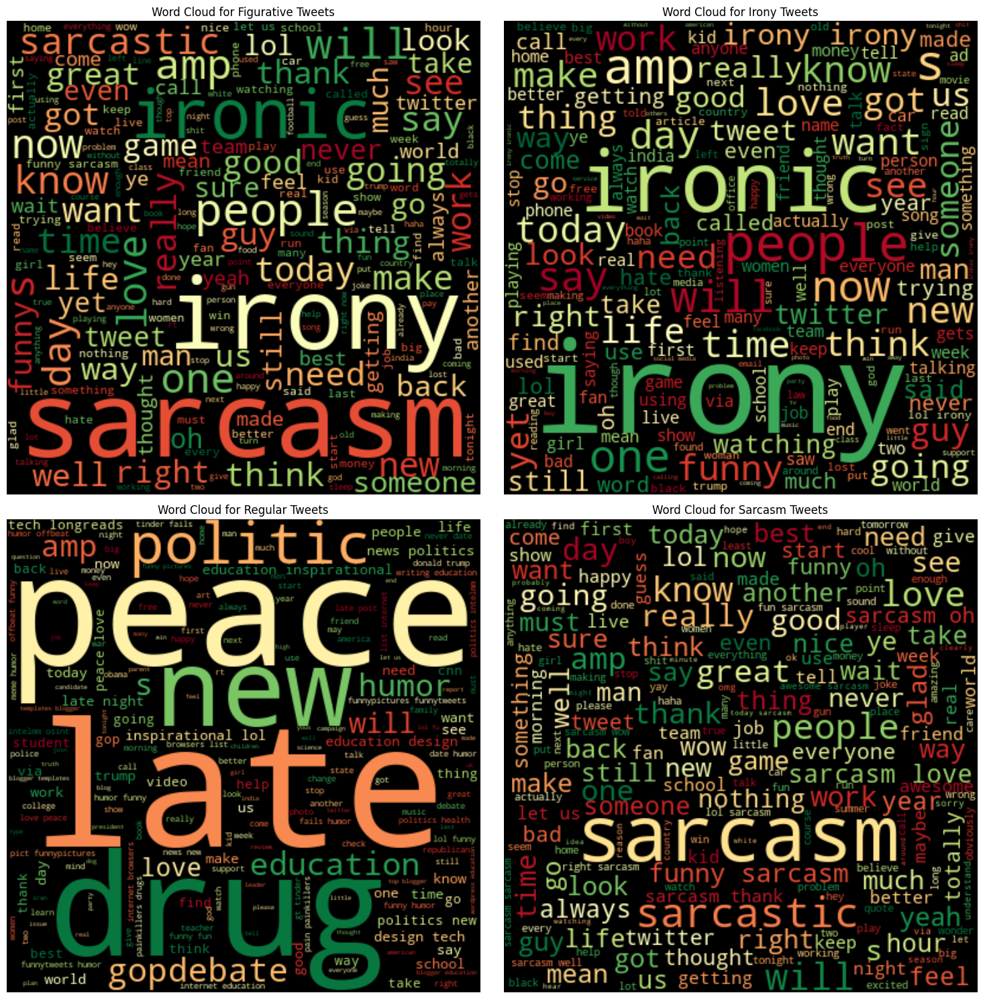

In [19]:
# Generate word clouds for each type
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

for idx, cleaned_data_class in enumerate(cleaned_data['class'].unique()):
    row = idx // 2
    col = idx % 2

    text = ' '.join(cleaned_data[cleaned_data['class'] == cleaned_data_class]['tweets'])

    wordcloud = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text)

    axes[row, col].imshow(wordcloud, interpolation='bilinear')
    axes[row, col].set_title(f'Word Cloud for {cleaned_data_class.capitalize()} Tweets')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

## Comparing the raw data with the cleaned raw data after removing punctuations

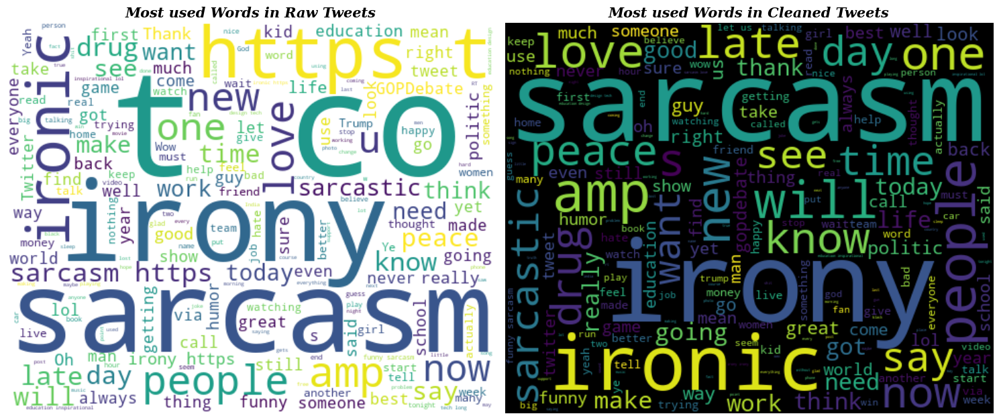

In [20]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Combine raw tweets and cleaned tweets into one string
raw_tweets = ' '.join(tweet['tweets'])
clean_tweets = ' '.join(cleaned)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Create a word cloud for raw tweets
wordcloud_raw = WordCloud(width=500, height=400, random_state=100, background_color='white').generate(raw_tweets)
axes[0].imshow(wordcloud_raw, interpolation='bilinear')
axes[0].set_title('Most used Words in Raw Tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[0].axis("off")

# Create a word cloud for cleaned tweets
wordcloud_clean = WordCloud(width=500, height=400, random_state=100, background_color='black').generate(clean_tweets)
axes[1].imshow(wordcloud_clean, interpolation='bilinear')
axes[1].set_title('Most used Words in Cleaned Tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[1].axis("off")

# Display the figure with both word clouds
plt.tight_layout()
plt.show()


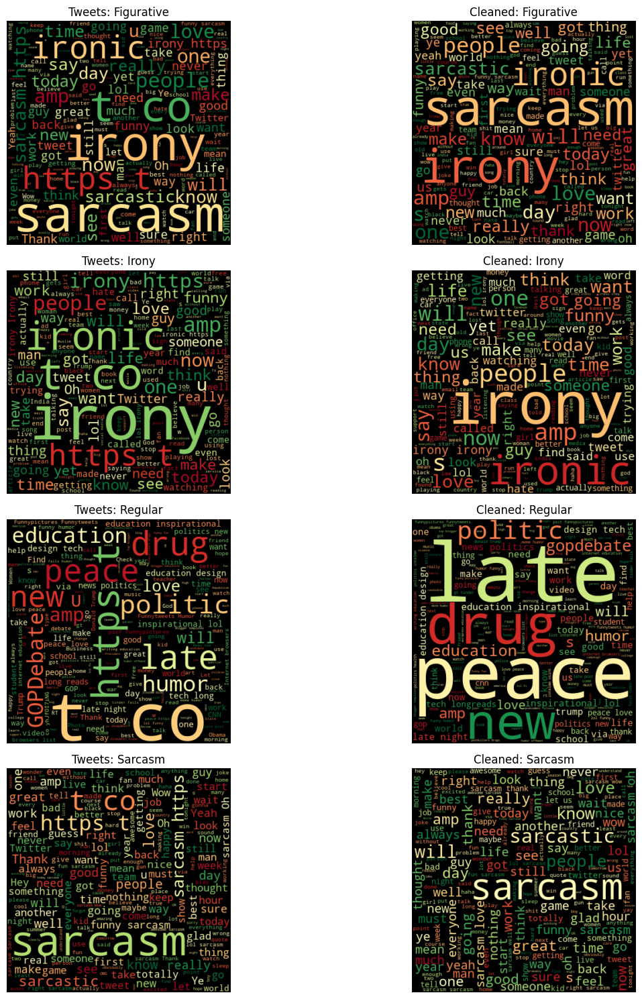

In [21]:
unique_classes = tweet['class'].unique()
cleaned_data = cleaned_data[cleaned_data['class'].isin(unique_classes)]

# Generate word clouds side by side
fig, axes = plt.subplots(len(unique_classes), 2, figsize=(15, 15))

for idx, tweet_class in enumerate(unique_classes):
    text_tweets = ' '.join(tweet[tweet['class'] == tweet_class]['tweets'])
    text_cleaned = ' '.join(cleaned_data[cleaned_data['class'] == tweet_class]['tweets'])

    wordcloud_tweets = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_tweets)
    wordcloud_cleaned = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_cleaned)

    axes[idx, 0].imshow(wordcloud_tweets, interpolation='bilinear')
    axes[idx, 0].set_title(f'Tweets: {tweet_class.capitalize()}')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(wordcloud_cleaned, interpolation='bilinear')
    axes[idx, 1].set_title(f'Cleaned: {tweet_class.capitalize()}')
    axes[idx, 1].axis('off')

plt.tight_layout()
plt.show()

In [22]:
cleaned_twt = cleaned.apply(word_tokenize)

# Join the words within the lists and count word frequencies
total_words_cleaned = [word.lower() for inner_list in cleaned_twt for word in inner_list]
wordfreqdist_cleaned = nltk.FreqDist(total_words_cleaned)
mostcommon_cleaned = wordfreqdist_cleaned.most_common(100)
mostcommon_cleaned[0:20]

[('the', 34567),
 ('sarcasm', 30008),
 ('to', 25826),
 ('irony', 24153),
 ('is', 21603),
 ('of', 15244),
 ('not', 14022),
 ('in', 13524),
 ('you', 13477),
 ('and', 13084),
 ('for', 11174),
 ('it', 10876),
 ('that', 10152),
 ('on', 9952),
 ('ironic', 8239),
 ('are', 8034),
 ('my', 7593),
 ('this', 6454),
 ('have', 5880),
 ('so', 5564)]

Removing Stop Words

In [23]:
# Join the words within the lists and count word frequencies
stop = stopwords.words('english')
cleaned_stp_twt = cleaned_twt.apply(lambda x: [word for word in x if word not in stop])
total_words_stp = [word.lower() for inner_list in cleaned_stp_twt for word in inner_list]
wordfreqdist_stp = nltk.FreqDist(total_words_stp)
mostcommon_stp = wordfreqdist_stp.most_common(100)
mostcommon_stp

[('sarcasm', 30008),
 ('irony', 24153),
 ('ironic', 8239),
 ('people', 3599),
 ('amp', 3496),
 ('news', 3453),
 ('love', 3382),
 ('like', 3349),
 ('peace', 3090),
 ('late', 2998),
 ('humor', 2928),
 ('education', 2877),
 ('get', 2758),
 ('politics', 2740),
 ('drugs', 2680),
 ('one', 2532),
 ('funny', 2472),
 ('day', 2463),
 ('would', 2456),
 ('good', 2238),
 ('lol', 2190),
 ('know', 2086),
 ('time', 1970),
 ('us', 1938),
 ('great', 1849),
 ('sarcastic', 1835),
 ('today', 1807),
 ('gopdebate', 1786),
 ('see', 1711),
 ('really', 1699),
 ('new', 1678),
 ('oh', 1637),
 ('going', 1617),
 ('life', 1607),
 ('right', 1592),
 ('work', 1524),
 ('got', 1490),
 ('well', 1428),
 ('want', 1401),
 ('way', 1363),
 ('go', 1361),
 ('think', 1360),
 ('never', 1301),
 ('make', 1251),
 ('need', 1235),
 ('back', 1234),
 ('much', 1225),
 ('could', 1129),
 ('thanks', 1118),
 ('via', 1117),
 ('night', 1083),
 ('say', 1063),
 ('man', 1058),
 ('better', 1023),
 ('best', 1021),
 ('first', 1019),
 ('someone', 1007

Comparing the raw data frame with the cleaned dataframe

In [24]:
comp = pd.DataFrame({"cleaned_twt":cleaned_twt,"cleaned_stp_twt":cleaned_stp_twt})
comp

,cleaned_twt,cleaned_stp_twt
0,"[be, aware, dirty, step, to, get, money, stayl...","[aware, dirty, step, get, money, staylight, st..."
1,"[sarcasm, for, people, who, do, not, understan...","[sarcasm, people, understand, diy, artattack]"
2,"[iminworkjeremy, medsingle, dailymail, readers...","[iminworkjeremy, medsingle, dailymail, readers..."
3,"[wilw, why, do, get, the, feeling, you, like, ...","[wilw, get, feeling, like, games, sarcasm]"
4,"[teacherarthurg, rweingarten, you, probably, j...","[teacherarthurg, rweingarten, probably, missed..."
...,...,...
81403,"[photo, image, via, we, heart, it, childhood, ...","[photo, image, via, heart, childhood, cool, fu..."
81404,"[never, knew, better, put, this, out, to, the,...","[never, knew, better, put, universe, lol, mayb..."
81405,"[hey, just, wanted, to, say, thanks, puberty, ...","[hey, wanted, say, thanks, puberty, letting, a..."
81406,"[am, sure, coverage, like, the, fox, news, spe...","[sure, coverage, like, fox, news, special, hid..."


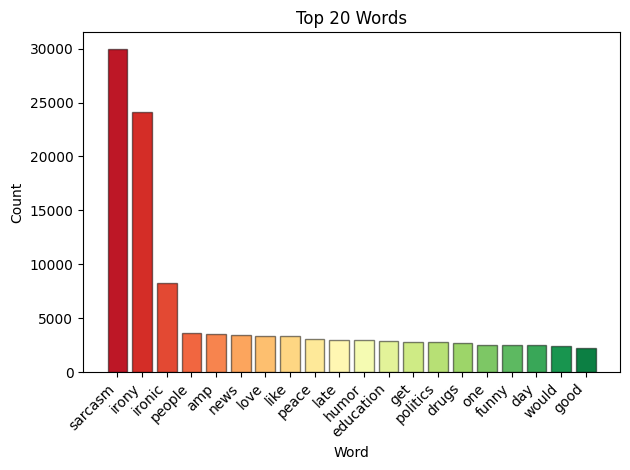

In [25]:
n_colors = 20
colors = sns.color_palette('RdYlGn', n_colors=n_colors)
top_words = [word for word, count in mostcommon_stp[:20]]
word_counts = [count for word, count in mostcommon_stp[:20]]

bars = plt.bar(top_words, word_counts, color=colors, edgecolor='k', linewidth=2)

# Adding shadow effect
for bar in bars:
    bar.set_edgecolor((0, 0, 0, 0.5))
    bar.set_linewidth(1)

plt.xlabel('Word')
plt.ylabel('Count')
plt.title('Top 20 Words')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()  # To avoid overlapping labels
plt.show()

In [26]:
cleaned_data_stop = pd.DataFrame({'class':tweet['class'], "tweets" : cleaned_stp_twt})
cleaned_data_stop.reset_index(drop=True, inplace= True)
# List of unique classes
unique_classes = cleaned_data_stop['class'].unique()

# Create separate data frames for each class
class_dataframes = {cls: cleaned_data_stop[cleaned_data_stop['class'] == cls].copy() for cls in unique_classes}

# Creating separate dataframe
figurative = pd.DataFrame(class_dataframes['figurative'])
irony  = pd.DataFrame(class_dataframes['irony'])
regular  = pd.DataFrame(class_dataframes['regular'])
sarcasm = pd.DataFrame(class_dataframes['sarcasm'])

figurative = figurative.drop(['class'], axis=1)
irony = irony.drop(['class'], axis=1)
regular = regular.drop(['class'], axis=1)
sarcasm = sarcasm.drop(['class'], axis=1)

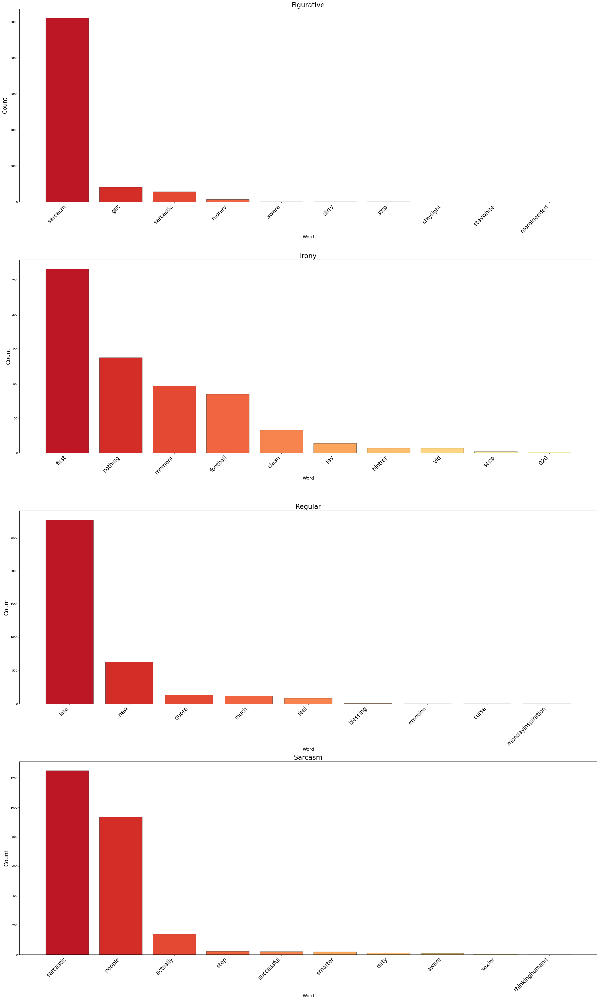

In [27]:
# Initialize colors
n_colors = 20
colors = sns.color_palette('RdYlGn', n_colors=n_colors)

# Define a function to plot a bar chart for each class
def plot_bar_chart(ax, class_df, title):
    valid_tweets = [sublist for sublist in class_df['tweets'] if isinstance(sublist, list)]
    top_words = [word for sublist in valid_tweets for word in sublist if len(word) > 0][:10]

    word_counts = {word: sum(sublist.count(word) for sublist in valid_tweets) for word in top_words}

    # Sort words by their counts in descending order
    sorted_words = sorted(word_counts.keys(), key=lambda x: word_counts[x], reverse=True)
    sorted_word_counts = [word_counts[word] for word in sorted_words]

    bars = ax.bar(sorted_words[:20], sorted_word_counts, color=colors, edgecolor='k', linewidth=2)

    for bar in bars:
        bar.set_edgecolor((0, 0, 0, 0.5))
        bar.set_linewidth(1)

    ax.set_title(title,fontsize=24)
    ax.set_xlabel('Word',fontsize=16)
    ax.set_ylabel('Count',fontsize=20)
    ax.set_xticklabels(sorted_words[:10], rotation=45, ha='right')
    ax.tick_params(axis='x', labelsize=20)

# Create subplots
fig, axes = plt.subplots(4, 1, figsize=(30, 50))
axes = axes.flatten()

# Plot for each class
plot_bar_chart(axes[0], figurative, 'Figurative')
plot_bar_chart(axes[1], irony, 'Irony')
plot_bar_chart(axes[2], regular, 'Regular')
plot_bar_chart(axes[3], sarcasm, 'Sarcasm')

plt.subplots_adjust(hspace=0.5)  # Adjust vertical spacing between subplots
plt.tight_layout()  # Call tight_layout on the figure
plt.show()

In [28]:
clean_very = cleaned_stp_twt. apply(' '.join)
cleaned_data_very = pd.DataFrame({'class':tweet['class'], "tweets" : clean_very})
cleaned_data_very.reset_index(drop=True, inplace= True)
cleaned_data_very

,class,tweets
0,figurative,aware dirty step get money staylight staywhite...
1,figurative,sarcasm people understand diy artattack
2,figurative,iminworkjeremy medsingle dailymail readers sen...
3,figurative,wilw get feeling like games sarcasm
4,figurative,teacherarthurg rweingarten probably missed tex...
...,...,...
81403,sarcasm,photo image via heart childhood cool funny sar...
81404,sarcasm,never knew better put universe lol maybe date ...
81405,sarcasm,hey wanted say thanks puberty letting apart it...
81406,sarcasm,sure coverage like fox news special hidden har...


In [29]:
# number of words
t_df =tweet['tweets'].str.len().sum()
joint = ' '.join(cleaned_data['tweets'])
cle = len(joint)
joint_stp = ' '.join(cleaned_data_very['tweets'])
cle_stp = len(joint_stp)
cleaned_data_count = pd.DataFrame({
    'Category':['actual word count ',
                'cleaned word count',
                'after removing stop words',
                '**words removed**'] ,
                'Count':[t_df, cle, cle_stp, (int(t_df)- int(cle_stp))]})
cleaned_data_count.T

,0,1,2,3
Category,actual word count,cleaned word count,after removing stop words,**words removed**
Count,8340662,7074622,5473154,2867508


# Similarly applying same for rest of the data sets

### Duplicates: Keep = First

In [30]:
# number of words in the dataframe
t1_df =tweet_1['tweets'].str.len().sum()
t1_df

6996402

In [31]:
#removing http links
tweet_no_link1 = tweet_1["tweets"].apply(lambda x: re.sub(r'http\S+', '', x))

#applying Contractions
expanded_text1 = tweet_no_link1.apply(lambda text: contractions.fix(text))

# Splitting the text into individual words or tokens.
# tokenization
twt1 = expanded_text1.apply(word_tokenize)

# Converting all the words to lower case
# Normalizing
low_twt1 = twt1.apply(lambda x: [word.lower() for word in x])

#Removing Punctuations
no_punc1 = low_twt1.apply(lambda x: [word for word in x if word not in result])

# Remove symbols and single-letter words, looping the code to run twice for clear data
for i in range(2):
    punch1 = no_punc1.apply(lambda x: [remove_symbols(word) for word in x if len(word) > 1])

# Join the tokenized, punctuation-removed clean data
clean1 = punch1. apply(' '.join)

# passing lambda function to remove additional space if exists between words
cleaned1 = clean1.apply(lambda x: re.sub(' +', ' ', x))

#Creating dataframe of cleaned data
cleaned_data_1 = pd.DataFrame({'class':tweet_1['class'], "tweets" : cleaned1})
cleaned_data_1.reset_index(drop=True, inplace= True)

cleaned_data_1

,class,tweets
0,figurative,be aware dirty step to get money staylight sta...
1,figurative,sarcasm for people who do not understand diy a...
2,figurative,iminworkjeremy medsingle dailymail readers bei...
3,figurative,wilw why do get the feeling you like games sar...
4,figurative,teacherarthurg rweingarten you probably just m...
...,...,...
67992,sarcasm,photo image via we heart it childhood cool fun...
67993,sarcasm,never knew better put this out to the universe...
67994,sarcasm,hey just wanted to say thanks puberty for lett...
67995,sarcasm,am sure coverage like the fox news special the...


In [32]:
cleaned_twt1 = cleaned1.apply(word_tokenize)
cleaned_stp_twt1 = cleaned_twt1.apply(lambda x: [word for word in x if word not in stop])
cleaned_stp_twt1

0        [aware, dirty, step, get, money, staylight, st...
1            [sarcasm, people, understand, diy, artattack]
2        [iminworkjeremy, medsingle, dailymail, readers...
3               [wilw, get, feeling, like, games, sarcasm]
4        [teacherarthurg, rweingarten, probably, missed...
                               ...                        
67992    [photo, image, via, heart, childhood, cool, fu...
67993    [never, knew, better, put, universe, lol, mayb...
67994    [hey, wanted, say, thanks, puberty, letting, a...
67995    [sure, coverage, like, fox, news, special, hid...
67996            [skeyno16, u13, believe, see, p, sarcasm]
Name: tweets, Length: 67997, dtype: object

### Duplicates: Keep = Last

In [33]:
#removing http links
tweet_no_link2 = tweet_2["tweets"].apply(lambda x: re.sub(r'http\S+', '', x))

#applying Contractions
expanded_text2 = tweet_no_link2.apply(lambda text: contractions.fix(text))

# Splitting the text into individual words or tokens.
# tokenization
twt2 = expanded_text2.apply(word_tokenize)

# Converting all the words to lower case
# Normalizing
low_twt2 = twt2.apply(lambda x: [word.lower() for word in x])

#Removing Punctuations
no_punc2 = low_twt2.apply(lambda x: [word for word in x if word not in result])

# Remove symbols and single-letter words, looping the code to run twice for clear data
for i in range(2):
    punch2 = no_punc2.apply(lambda x: [remove_symbols(word) for word in x if len(word) > 1])

# Join the tokenized, punctuation-removed clean data
clean2 = punch2. apply(' '.join)

# passing lambda function to remove additional space if exists between words
cleaned2 = clean2.apply(lambda x: re.sub(' +', ' ', x))

#Creating dataframe of cleaned data
cleaned_data_2 = pd.DataFrame({'class':tweet_2['class'], "tweets" : cleaned2})
cleaned_data_2.reset_index(drop=True, inplace= True)
cleaned_data_2

,class,tweets
0,figurative,sarcasm for people who do not understand diy a...
1,figurative,man wish could sexually harass an intoxicated ...
2,figurative,ciarakellydoc lunchtiment do not be daft dr ci...
3,figurative,totally not panicattack inducing way to spend ...
4,figurative,this is my bed it is all the way on the floor ...
...,...,...
67992,sarcasm,photo image via we heart it childhood cool fun...
67993,sarcasm,never knew better put this out to the universe...
67994,sarcasm,hey just wanted to say thanks puberty for lett...
67995,sarcasm,am sure coverage like the fox news special the...


In [34]:
cleaned_twt2 = cleaned2.apply(word_tokenize)
cleaned_stp_twt2 = cleaned_twt2.apply(lambda x: [word for word in x if word not in stop])
cleaned_stp_twt2

0            [sarcasm, people, understand, diy, artattack]
1        [man, wish, could, sexually, harass, intoxicat...
2        [ciarakellydoc, lunchtiment, daft, dr, ciara, ...
3        [totally, panicattack, inducing, way, spend, s...
4                          [bed, way, floor, yay, sarcasm]
                               ...                        
67992    [photo, image, via, heart, childhood, cool, fu...
67993    [never, knew, better, put, universe, lol, mayb...
67994    [hey, wanted, say, thanks, puberty, letting, a...
67995    [sure, coverage, like, fox, news, special, hid...
67996            [skeyno16, u13, believe, see, p, sarcasm]
Name: tweets, Length: 67997, dtype: object

### Duplicates: Keep = Unique

In [35]:
#removing http links
tweet_no_link3 = tweet_3["tweets"].apply(lambda x: re.sub(r'http\S+', '', x))

#applying Contractions
expanded_text3 = tweet_no_link3.apply(lambda text: contractions.fix(text))

# Splitting the text into individual words or tokens.
# tokenization
twt3 = expanded_text3.apply(word_tokenize)

# Converting all the words to lower case
# Normalizing
low_twt3 = twt3.apply(lambda x: [word.lower() for word in x])

#Removing Punctuations
no_punc3 = low_twt3.apply(lambda x: [word for word in x if word not in result])

# Remove symbols and single-letter words, looping the code to run twice for clear data
for i in range(2):
    punch3 = no_punc3.apply(lambda x: [remove_symbols(word) for word in x if len(word) > 1])

# Join the tokenized, punctuation-removed clean data
clean3= punch3.apply(' '.join)

# passing lambda function to remove additional space if exists between words
cleaned3 = clean3.apply(lambda x: re.sub(' +', ' ', x))


#Creating dataframe of cleaned data
cleaned_data_3 = pd.DataFrame({'class':tweet_3['class'], "tweets" : cleaned3})
cleaned_data_3.reset_index(drop=True, inplace= True)
cleaned_data_3

,class,tweets
0,figurative,sarcasm for people who do not understand diy a...
1,figurative,man wish could sexually harass an intoxicated ...
2,figurative,ciarakellydoc lunchtiment do not be daft dr ci...
3,figurative,totally not panicattack inducing way to spend ...
4,figurative,this is my bed it is all the way on the floor ...
...,...,...
54613,sarcasm,photo image via we heart it childhood cool fun...
54614,sarcasm,never knew better put this out to the universe...
54615,sarcasm,hey just wanted to say thanks puberty for lett...
54616,sarcasm,am sure coverage like the fox news special the...


In [36]:
cleaned_twt3 = cleaned3.apply(word_tokenize)
cleaned_stp_twt3 = cleaned_twt3.apply(lambda x: [word for word in x if word not in stop])
cleaned_stp_twt3

0            [sarcasm, people, understand, diy, artattack]
1        [man, wish, could, sexually, harass, intoxicat...
2        [ciarakellydoc, lunchtiment, daft, dr, ciara, ...
3        [totally, panicattack, inducing, way, spend, s...
4                          [bed, way, floor, yay, sarcasm]
                               ...                        
54613    [photo, image, via, heart, childhood, cool, fu...
54614    [never, knew, better, put, universe, lol, mayb...
54615    [hey, wanted, say, thanks, puberty, letting, a...
54616    [sure, coverage, like, fox, news, special, hid...
54617            [skeyno16, u13, believe, see, p, sarcasm]
Name: tweets, Length: 54618, dtype: object

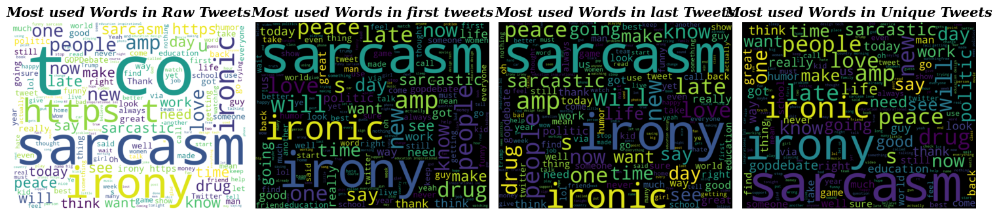

In [37]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Combine raw tweets and cleaned tweets into one string
raw_tweets = ' '.join(tweet['tweets'])
clean_tweets1 = ' '.join(cleaned1)
clean_tweets2 = ' '.join(cleaned2)
clean_tweets3 = ' '.join(cleaned3)


# Create a figure with two subplots
fig, axes = plt.subplots(1, 4, figsize=(15, 7))

# Create a word cloud for raw tweets
wordcloud_raw = WordCloud(width=1000, height=800, random_state=100, background_color='white').generate(raw_tweets)
axes[0].imshow(wordcloud_raw, interpolation='bilinear')
axes[0].set_title('Most used Words in Raw Tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[0].axis("off")

# Create a word cloud for cleaned tweets
wordcloud_clean = WordCloud(width=1000, height=800, random_state=100, background_color='black').generate(clean_tweets1)
axes[1].imshow(wordcloud_clean, interpolation='bilinear')
axes[1].set_title('Most used Words in first tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[1].axis("off")

# Create a word cloud for cleaned tweets
wordcloud_clean = WordCloud(width=1000, height=800, random_state=100, background_color='black').generate(clean_tweets2)
axes[2].imshow(wordcloud_clean, interpolation='bilinear')
axes[2].set_title('Most used Words in last Tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[2].axis("off")

# Create a word cloud for cleaned tweets
wordcloud_clean = WordCloud(width=1000, height=800, random_state=100, background_color='black').generate(clean_tweets3)
axes[3].imshow(wordcloud_clean, interpolation='bilinear')
axes[3].set_title('Most used Words in Unique Tweets', family='serif', fontsize=15, weight='bold', style='italic')
axes[3].axis("off")

# Display the figure with both word clouds
plt.tight_layout()
plt.show()


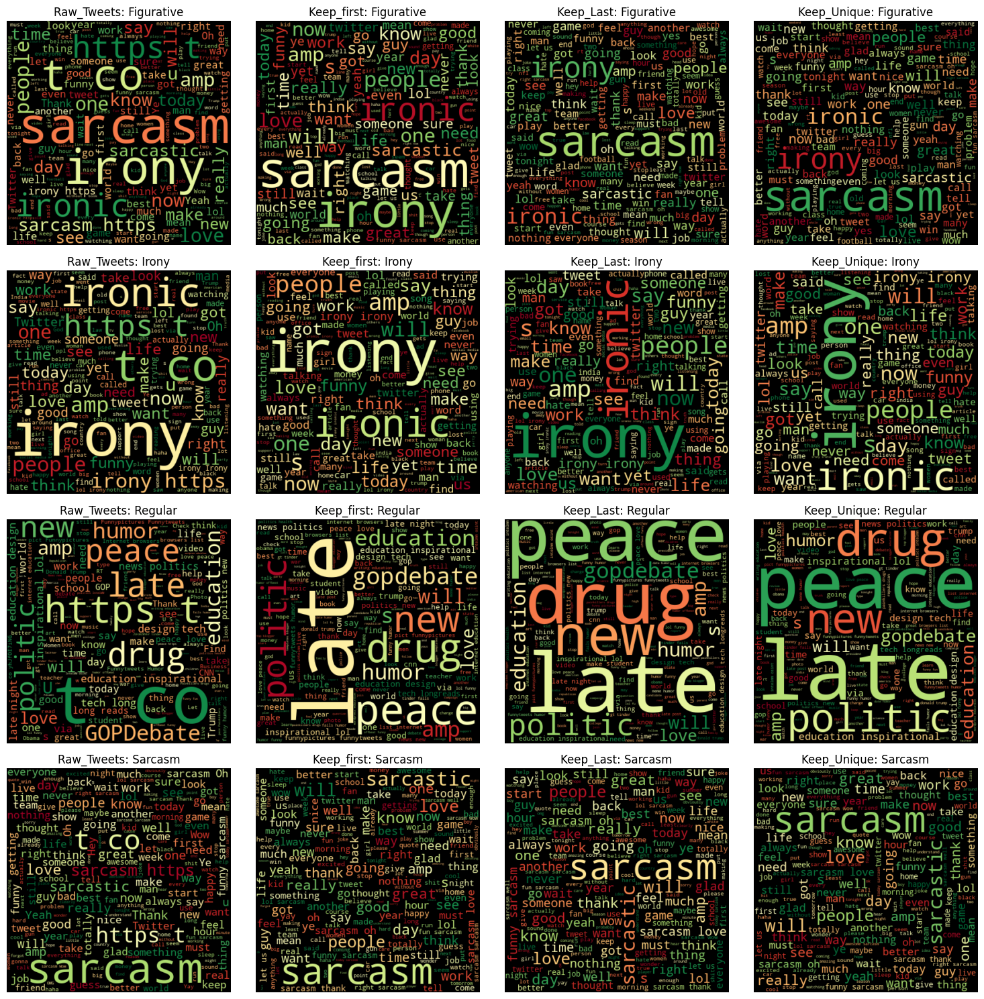

In [38]:
unique_classes = tweet['class'].unique()
cleaned_data_1 = cleaned_data_1[cleaned_data_1['class'].isin(unique_classes)]
cleaned_data_2 = cleaned_data_2[cleaned_data_2['class'].isin(unique_classes)]
cleaned_data_3 = cleaned_data_3[cleaned_data_3['class'].isin(unique_classes)]

# Generate word clouds side by side
fig, axes = plt.subplots(len(unique_classes), 4, figsize=(15, 15))

for idx, tweet_class in enumerate(unique_classes):
    text_tweets = ' '.join(tweet[tweet['class'] == tweet_class]['tweets'])
    text_cleaned1 = ' '.join(cleaned_data_1[cleaned_data_1['class'] == tweet_class]['tweets'])
    text_cleaned2 = ' '.join(cleaned_data_2[cleaned_data_2['class'] == tweet_class]['tweets'])
    text_cleaned3 = ' '.join(cleaned_data_3[cleaned_data_3['class'] == tweet_class]['tweets'])


    wordcloud_tweets = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_tweets)
    wordcloud_cleaned1 = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_cleaned1)
    wordcloud_cleaned2 = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_cleaned2)
    wordcloud_cleaned3 = WordCloud(width=400, height=400,colormap="RdYlGn", background_color='black').generate(text_cleaned3)

    axes[idx, 0].imshow(wordcloud_tweets, interpolation='bilinear')
    axes[idx, 0].set_title(f'Raw_Tweets: {tweet_class.capitalize()}')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(wordcloud_cleaned1, interpolation='bilinear')
    axes[idx, 1].set_title(f'Keep_first: {tweet_class.capitalize()}')
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(wordcloud_cleaned2, interpolation='bilinear')
    axes[idx, 2].set_title(f'Keep_Last: {tweet_class.capitalize()}')
    axes[idx, 2].axis('off')

    axes[idx, 3].imshow(wordcloud_cleaned3, interpolation='bilinear')
    axes[idx, 3].set_title(f'Keep_Unique: {tweet_class.capitalize()}')
    axes[idx, 3].axis('off')
plt.tight_layout()
plt.show()

## It can be observed that there is not much of difference by keeping any of the tweets, i.e., either First, Last or Unique

In [39]:
total_words_cleaned1 = [word.lower() for inner_list in cleaned_stp_twt1 for word in inner_list]

wordfreqdist_stp1 = nltk.FreqDist(total_words_cleaned1)
mostcommon_stp1 = wordfreqdist_stp1.most_common(20)

df_most_common1 = pd.DataFrame(mostcommon_stp1, columns=['Word', 'Frequency'])
df_most_common1

,Word,Frequency
0,sarcasm,24962
1,irony,17964
2,ironic,6125
3,news,3362
4,peace,3044
5,late,2943
6,amp,2930
7,people,2907
8,love,2895
9,humor,2857


In [40]:
total_words_cleaned2 = [word.lower() for inner_list in cleaned_stp_twt2 for word in inner_list]

wordfreqdist_stp2 = nltk.FreqDist(total_words_cleaned2)
mostcommon_stp2 = wordfreqdist_stp2.most_common(20)

df_most_common2 = pd.DataFrame(mostcommon_stp2, columns=['Word', 'Frequency'])
df_most_common2

,Word,Frequency
0,sarcasm,24962
1,irony,17964
2,ironic,6125
3,news,3362
4,peace,3044
5,late,2943
6,amp,2930
7,people,2907
8,love,2895
9,humor,2857


In [41]:
total_words_cleaned3 = [word.lower() for inner_list in cleaned_stp_twt3 for word in inner_list]

wordfreqdist_stp3 = nltk.FreqDist(total_words_cleaned3)
mostcommon_stp3 = wordfreqdist_stp3.most_common(20)

df_most_common3 = pd.DataFrame(mostcommon_stp3, columns=['Word', 'Frequency'])
df_most_common3

,Word,Frequency
0,sarcasm,19920
1,irony,11788
2,ironic,4012
3,news,3271
4,peace,3012
5,late,2888
6,education,2808
7,humor,2786
8,politics,2654
9,drugs,2648


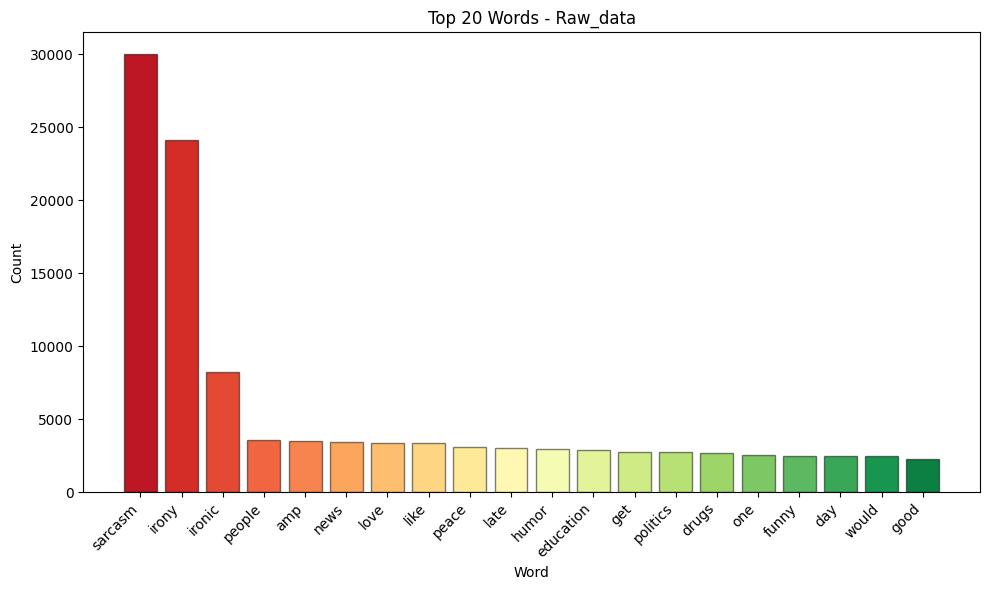

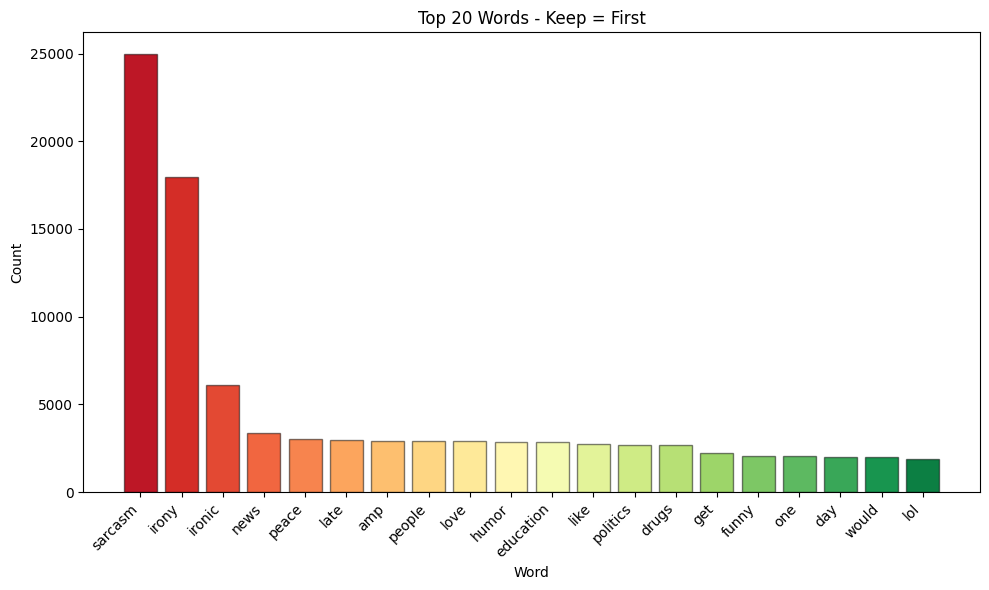

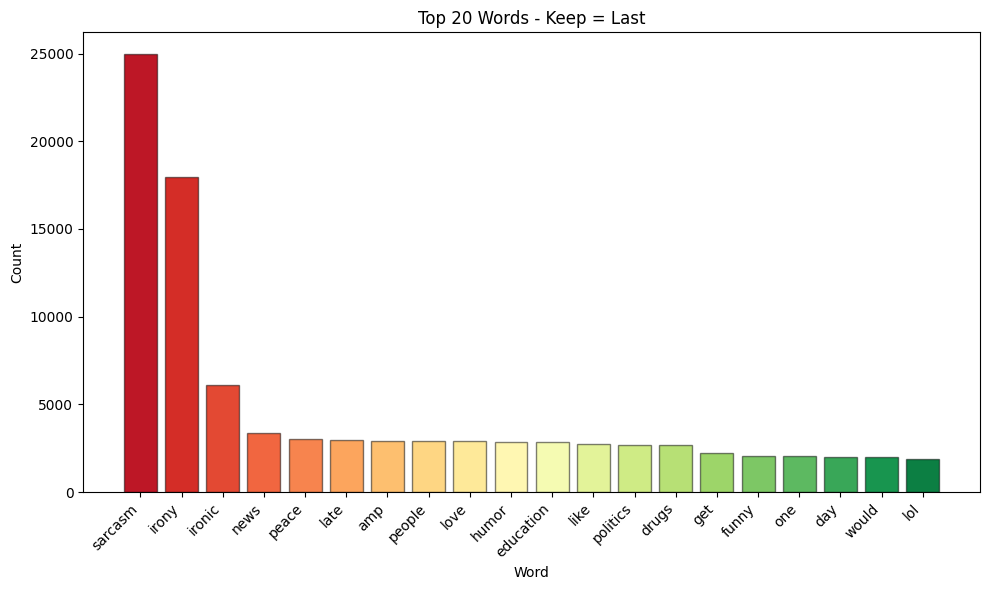

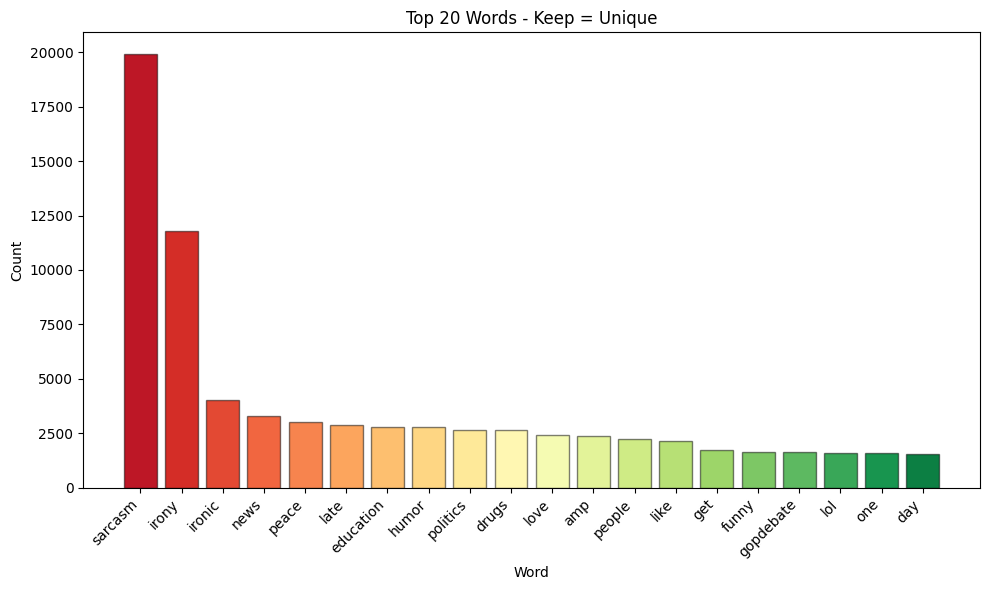

In [42]:
datasets = [mostcommon_stp, mostcommon_stp1, mostcommon_stp2, mostcommon_stp3]
dataset_names = ["Raw_data", "Keep = First", "Keep = Last", "Keep = Unique"]


n_colors = 20
colors = sns.color_palette('RdYlGn', n_colors=n_colors)

for index, dataset in enumerate(datasets):
    top_words = [word for word, count in dataset[:20]]
    word_counts = [count for word, count in dataset[:20]]

    plt.figure(figsize=(10, 6))  # Optional: Set the figure size

    bars = plt.bar(top_words, word_counts, color=colors, edgecolor='k', linewidth=2)

    # Adding shadow effect
    for bar in bars:
        bar.set_edgecolor((0, 0, 0, 0.5))
        bar.set_linewidth(1)

    plt.xlabel('Word')
    plt.ylabel('Count')
    # plt.title(f'Top 20 Words - Dataset {index+1}')
    plt.title(f'Top 20 Words - {dataset_names[index]}')

    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.tight_layout()  # To avoid overlapping labels

    # Optional: Save each plot to a file
    plt.savefig(f'dataset_{index+1}_top_20_words.png')

    plt.show()


### * From the above Plots, it can be observed that most common top words are quite similar for any case
### * Any of the 3 cases can be used for futher processing from the above conclusions of word cloud and bar plot, using UNIQUE category of tweets and dropping all the duplicated tweets including the actual

In [43]:
# Create a new file containing only First tweets with stop words
cleaned_data = cleaned_data.drop_duplicates(subset=["tweets"], keep=False)
cleaned_data.reset_index(drop=True, inplace= True)
cleaned_data.to_csv("cleaned_data.csv", index=False)

# Create a new file containing only First tweets without stop words
cleaned_data_very = cleaned_data_very.drop_duplicates(subset=["tweets"], keep=False)
cleaned_data_very.reset_index(drop=True, inplace= True)
cleaned_data_very.to_csv("cleaned_data_very.csv", index=False)